<div align="center">
    <a href="https://www.visual-layer.com" target="_blank" rel="noopener noreferrer">
    <picture>
    <source media="(prefers-color-scheme: dark)" srcset="https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo_dark_mode.png" width=350>
    <source media="(prefers-color-scheme: light)" srcset="https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo.png" width=350>
    <img alt="vl logo." src="https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo.png">
    </picture>
    </a>
    <br>
    <br>
    <a href="https://visualdatabase.slack.com/join/shared_invite/zt-19jaydbjn-lNDEDkgvSI1QwbTXSY6dlA#/shared-invite/email" target="_blank" rel="noopener noreferrer">
    <img src="https://img.shields.io/badge/JOIN US ON SLACK-4A154B?style=for-the-badge&logo=slack&logoColor=white" alt="Logo">
    </a>
    <a href="https://visual-layer.readme.io/discuss" target="_blank" rel="noopener noreferrer">
    <img src="https://img.shields.io/badge/DISCUSSION%20FORUM-slateblue?style=for-the-badge&logo=discourse&logoWidth=20" alt="Logo">
    </a>
    <a href="https://www.linkedin.com/company/visual-layer/" target="_blank" rel="noopener noreferrer">
    <img src="https://img.shields.io/badge/LinkedIn-0077B5?style=for-the-badge&logo=linkedin&logoColor=white" alt="Logo">
    </a>
    <a href="https://twitter.com/visual_layer" target="_blank" rel="noopener noreferrer">
    <img src="https://img.shields.io/badge/Twitter-1DA1F2?style=for-the-badge&logo=twitter&logoColor=white" alt="Logo">
    </a>
    <a href="https://www.youtube.com/@visual-layer" target="_blank" rel="noopener noreferrer">
    <img src="https://img.shields.io/badge/-YouTube-black.svg?style=for-the-badge&logo=youtube&colorB=red" alt="Logo">
    </a>
</div>

# Run fastdup with TIMM Embeddings

[![Open in Colab](https://img.shields.io/badge/Open%20in%20Colab-blue?style=for-the-badge&logo=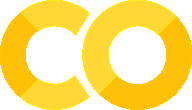&labelColor=gray)](https://colab.research.google.com/github/visual-layer/fastdup/blob/main/examples/embeddings-timm.ipynb)
[![Kaggle](https://img.shields.io/badge/Open%20in%20Kaggle-blue?style=for-the-badge&logo=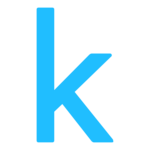&labelColor=gray)](https://kaggle.com/kernels/welcome?src=https://github.com/visual-layer/fastdup/blob/main/examples/embeddings-timm.ipynb)
[![Explore the Docs](https://img.shields.io/badge/Explore%20the%20Docs-blue?style=for-the-badge&labelColor=gray&logo=read-the-docs)](https://visual-layer.readme.io/docs/embeddings-timm)

In this notebook we show an end-to-end example on how you can pre-compute embeddings using any models from TIMM run fastdup on top of the embeddings to surface dataset issues.

## Installation

First, let's install the neccessary packages:

- fastdup - To analyze issues in the dataset.
- [TIMM (PyTorch Image Models)](https://github.com/huggingface/pytorch-image-models) - To acquire pre-trained models.

In [ ]:
!pip install -Uq fastdup timm

Now, test the installation. If there's no error message, we are ready to go.

In [2]:
import fastdup
fastdup.__version__

'1.46'

## Download Dataset

In this notebook, we will the [Price Match Guarantee Dataset](https://www.kaggle.com/competitions/shopee-product-matching/) from Shopee from Kaggle.  
The dataset consists of images from users who sell products on the Shopee online platform.

Download the dataset [here](https://www.kaggle.com/competitions/shopee-product-matching/data), unzip, and place it in the current directory.

Here's a snapshot showing some of the images from the dataset.
![img](https://files.readme.io/09f6849-download.png)

## List TIMM Models
There are over a thousand models on TIMM. Let's list down models that match the keyword `dino`.

In [3]:
import timm
timm.list_models("*dino*", pretrained=True)

['resmlp_12_224.fb_dino',
 'resmlp_24_224.fb_dino',
 'vit_base_patch8_224.dino',
 'vit_base_patch14_dinov2.lvd142m',
 'vit_base_patch16_224.dino',
 'vit_giant_patch14_dinov2.lvd142m',
 'vit_large_patch14_dinov2.lvd142m',
 'vit_small_patch8_224.dino',
 'vit_small_patch14_dinov2.lvd142m',
 'vit_small_patch16_224.dino']

Now, pick a model of your choice. For demonstration, we will go with a relatively new model `vit_small_patch14_dinov2.lvd142m` from MetaAI. 

DINOv2 models produce high-performance visual features that can be directly employed with classifiers as simple as linear layers on a variety of computer vision tasks; these visual features are robust and perform well across domains without any requirement for fine-tuning. Read more about DINOv2 [here](https://github.com/facebookresearch/dinov2).

It makes sense for us to use DINOv2 as a model to create an embedding of the dataset.

## Compute Embeddings using TIMM

Loading TIMM models in fastdup is seamless with the `TimmEncoder` wrapper class. This ensures all TIMM models can be used in fastdup to compute the embeddings of your dataset.  
Under the hood, the wrapper class loads the model from TIMM excluding the final classification layer.

Next, let's load the DINOv2 model using the `TimmEncoder` wrapper.

In [5]:
from fastdup.embeddings_timm import TimmEncoder
timm_model = TimmEncoder('vit_small_patch14_dinov2.lvd142m') 

INFO:fastdup.embeddings.timm:Initializing model - vit_small_patch14_dinov2.lvd142m.
INFO:timm.models._builder:Loading pretrained weights from Hugging Face hub (timm/vit_small_patch14_dinov2.lvd142m)
INFO:timm.models._hub:[timm/vit_small_patch14_dinov2.lvd142m] Safe alternative available for 'pytorch_model.bin' (as 'model.safetensors'). Loading weights using safetensors.
INFO:fastdup.embeddings.timm:Model loaded on device - cuda


Here are other the parameters for `TimmEncoder`

+ `model_name` (str): The name of the model architecture to use.
+ `num_classes` (int): The number of classes for the model. Use num_features=0 to exclude the last layer. Default: `0`.
+ `pretrained` (bool): Whether to load pretrained weights. Default: `True`.
+ `device` (str): Which device to load the model on. Choices: "cuda" or "cpu". Default: `None`.
+ `torch_compile` (bool): Whether to use `torch.compile` to optimize model. Default `False`.

To start computing embeddings, specify the directory where the images are stored.

In [6]:
timm_model.compute_embeddings("shopee-product-matching/train_images")

Computing embeddings:   0%|          | 0/32412 [00:00<?, ? images/s]

INFO:fastdup.embeddings.timm:Saving embeddings in directory - saved_embeddings .


Once done, the embeddings are stored in a folder named `saved_embeddings` in the current directory as a `numpy` array with the appropriate model name. 

For this example the file name is `vit_small_patch14_dinov2.lvd142m_embeddings.npy`.

## Run fastdup

Now what's left is to load the embeddings into fastdup and run an analysis to surface dataset issues.

In [7]:
fd = fastdup.create(input_dir=timm_model.img_folder)
fd.run(annotations=timm_model.file_paths, embeddings=timm_model.embeddings)

FastDup Software, (C) copyright 2022 Dr. Amir Alush and Dr. Danny Bickson.
2023-10-16 11:43:51 [INFO] Found total 32412 images to run on
Finished histogram 7.114
Finished bucket sort 7.176
2023-10-16 11:43:51 [INFO] 886) Finished write_index() NN model
2023-10-16 11:43:51 [INFO] Stored nn model index file work_dir/nnf.index
2023-10-16 11:43:52 [INFO] Total time took 1454 ms
2023-10-16 11:43:52 [INFO] Found a total of 9530 fully identical images (d>0.990), which are 14.70 % of total graph edges
2023-10-16 11:43:52 [INFO] Found a total of 5040 nearly identical images(d>0.980), which are 7.77 % of total graph edges
2023-10-16 11:43:52 [INFO] Found a total of 27522 above threshold images (d>0.900), which are 42.46 % of total graph edges
2023-10-16 11:43:52 [INFO] Found a total of 3241 outlier images         (d<0.050), which are 5.00 % of total graph edges
2023-10-16 11:43:52 [INFO] Min distance found 0.105 max distance 1.000
2023-10-16 11:43:52 [INFO] Running connected components for ccthr

Traceback (most recent call last):
  File "/home/dnth/anaconda3/envs/fastdup-comb/lib/python3.10/site-packages/fastdup/fastdup_controller.py", line 669, in summary
    stats_df = self.img_stats()
  File "/home/dnth/anaconda3/envs/fastdup-comb/lib/python3.10/site-packages/fastdup/fastdup_controller.py", line 390, in img_stats
    assert df is not None, f'No stats file found in {self._work_dir}'
AssertionError: No stats file found in work_dir


0

## Visualize

You can use all of fastdup gallery methods to view duplicates, clusters, etc.

Let's view the image clusters.

Generating gallery:   0%|          | 0/20 [00:00<?, ?it/s]

Finished OK. Components are stored as image files work_dir/galleries/components_[index].jpg
Stored components visual view in  work_dir/galleries/components.html
Execution time in seconds 3.7
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



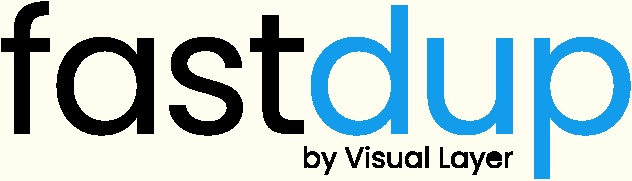
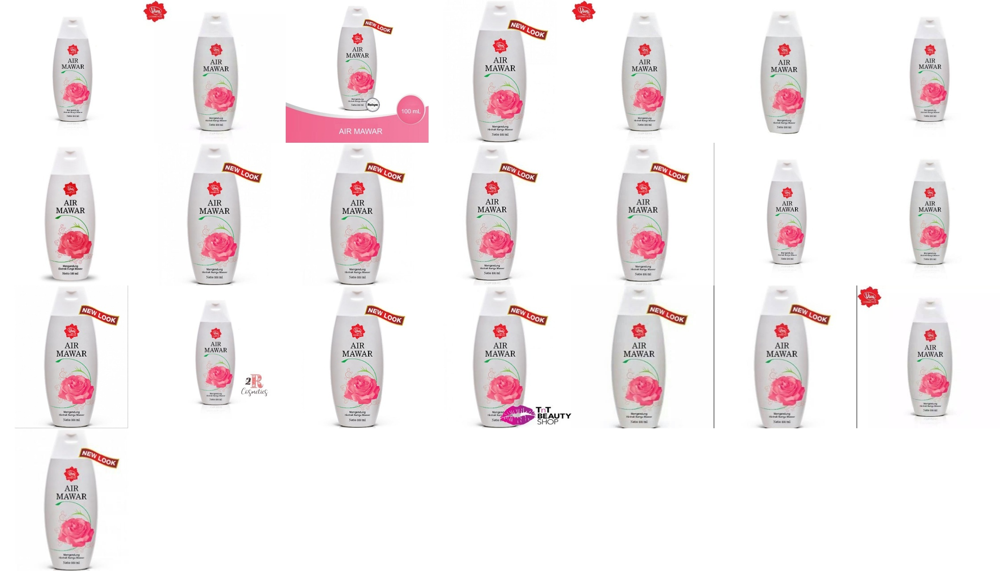
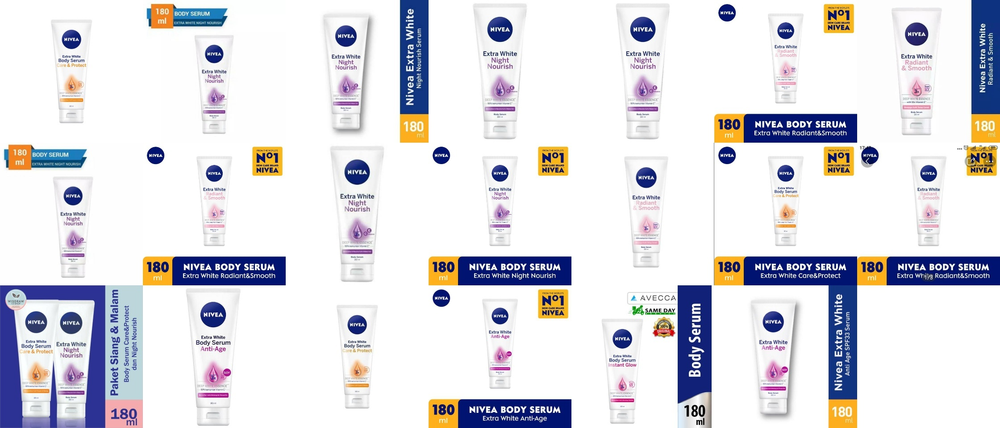
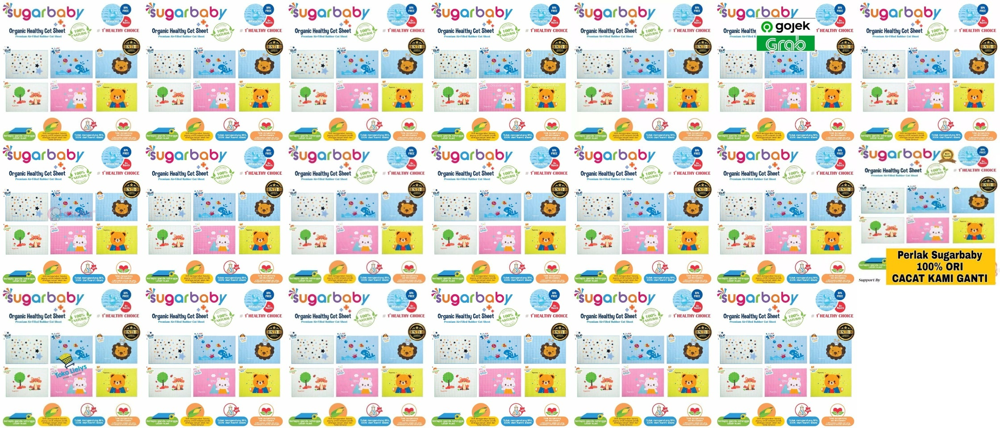
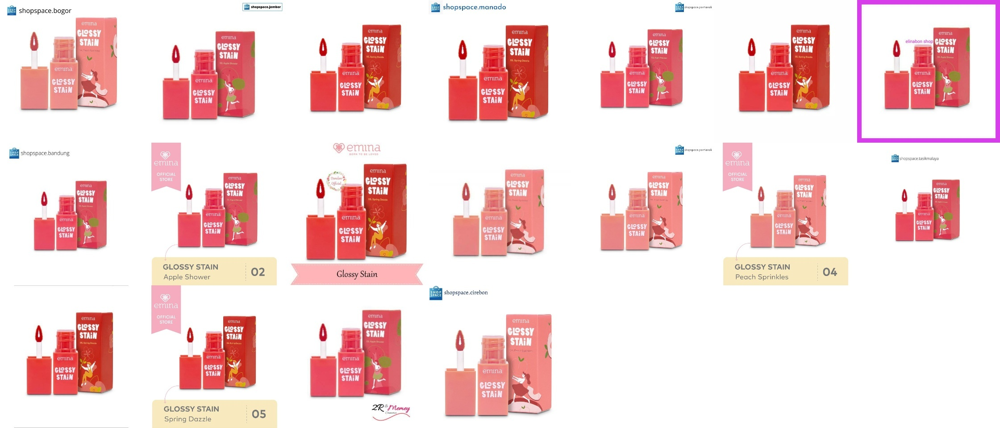
...
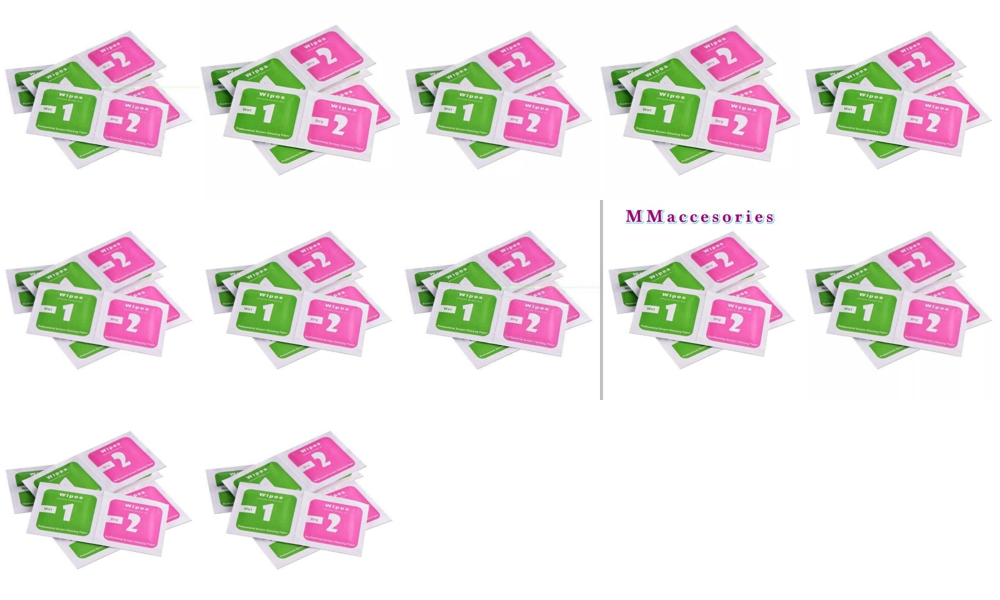
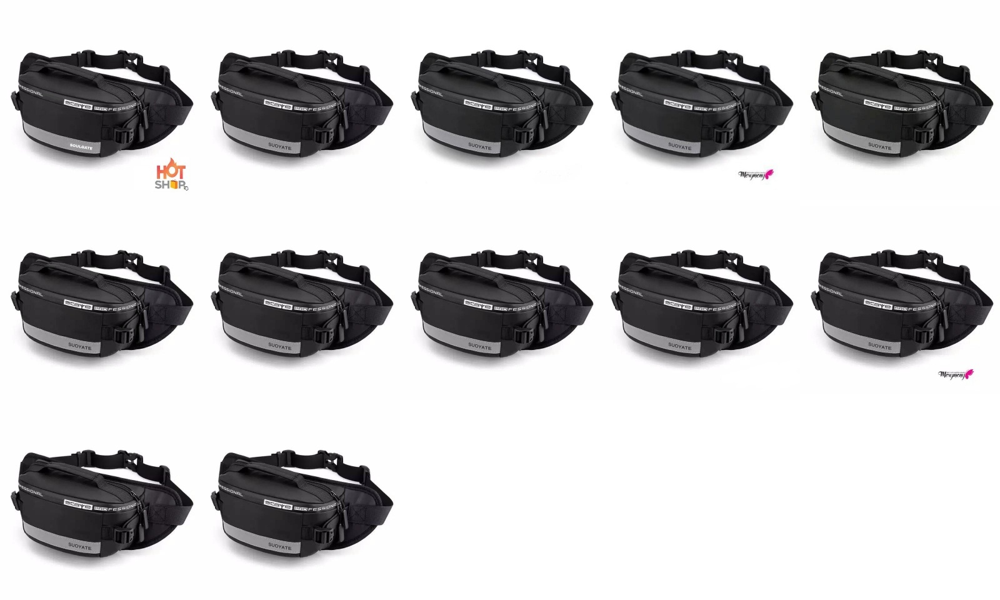
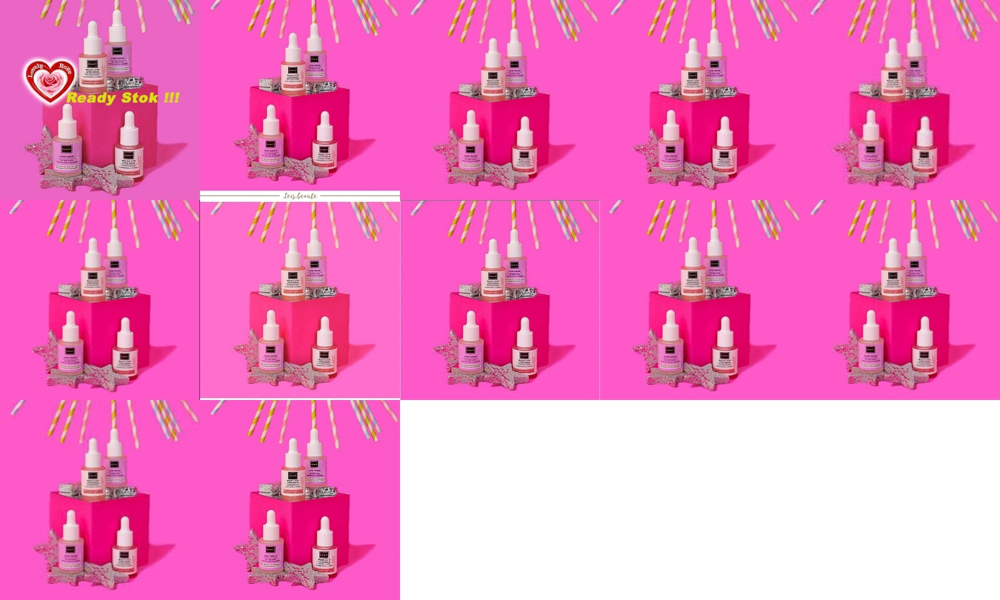
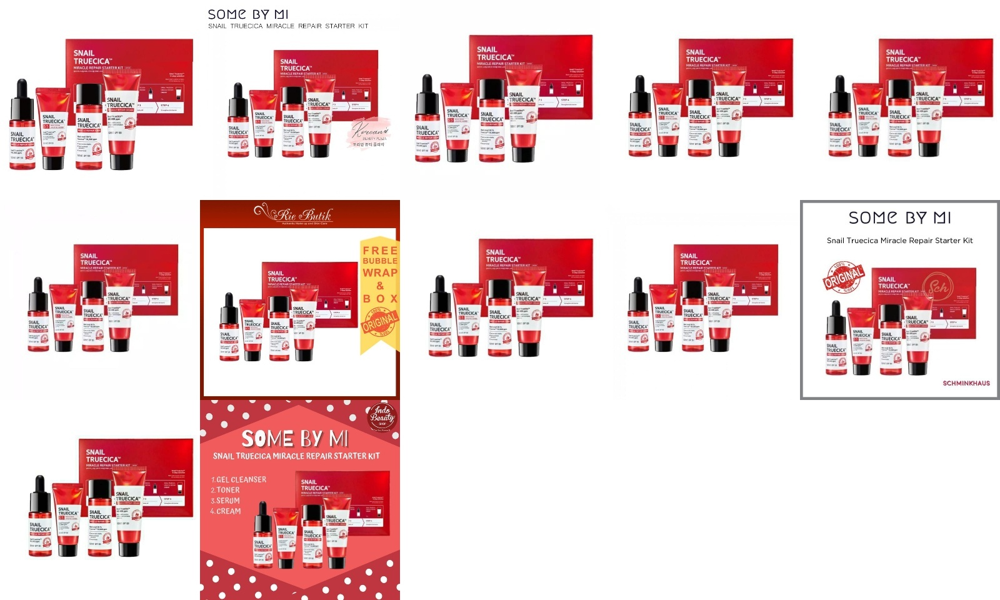
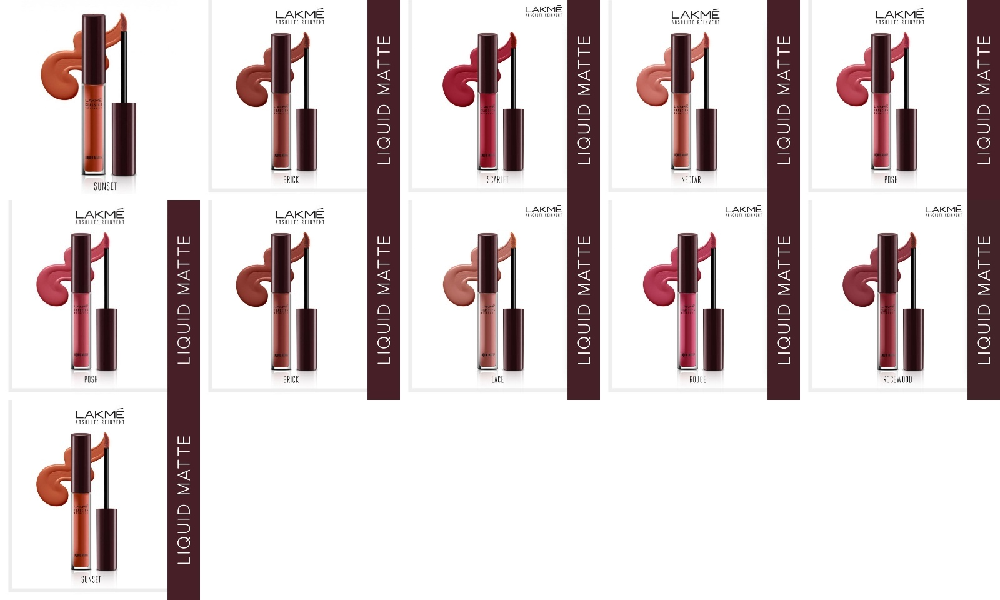

0

In [8]:
fd.vis.component_gallery()

And duplicates gallery.

Generating gallery:   0%|          | 0/20 [00:00<?, ?it/s]

Stored similarity visual view in  work_dir/galleries/duplicates.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



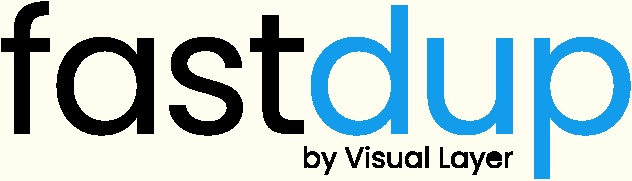
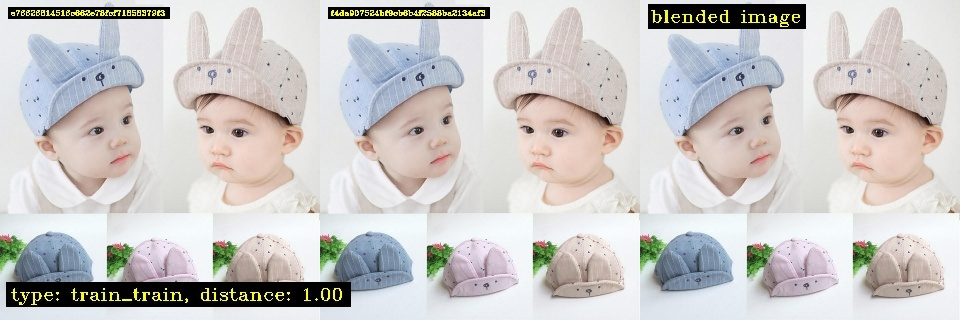
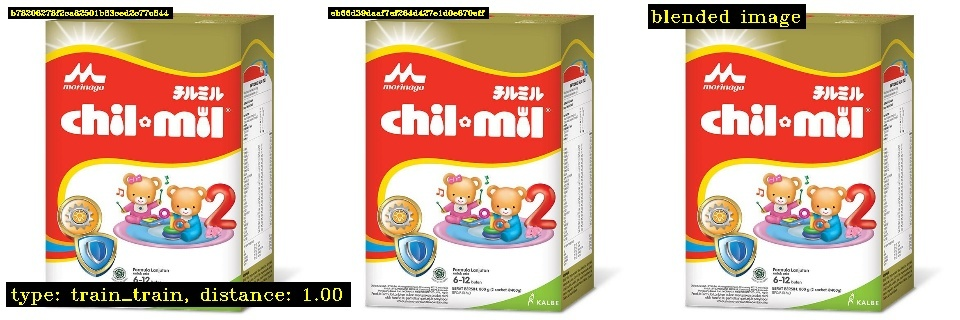
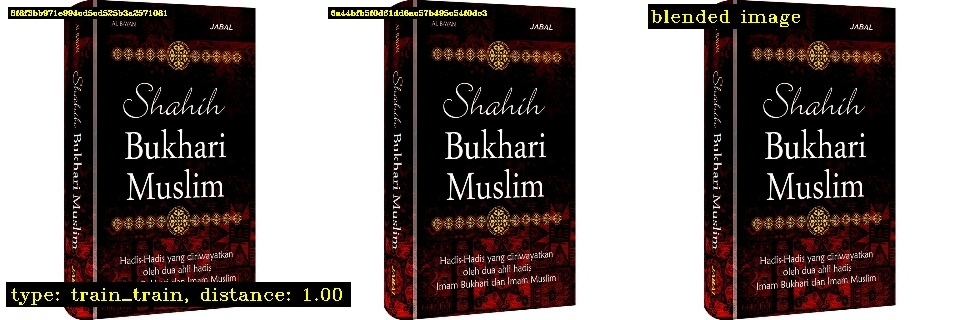
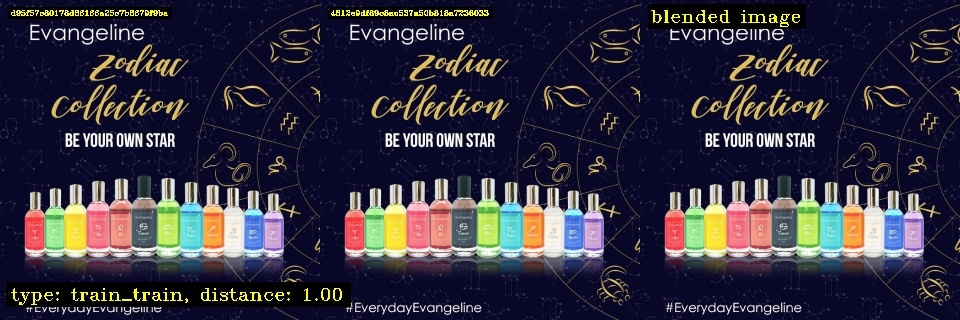
...
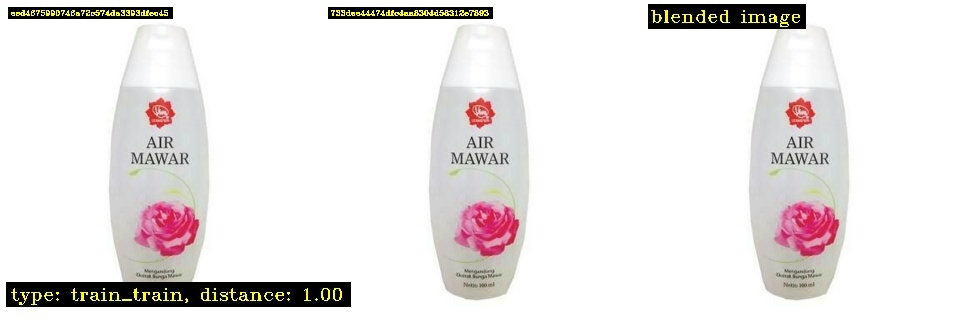
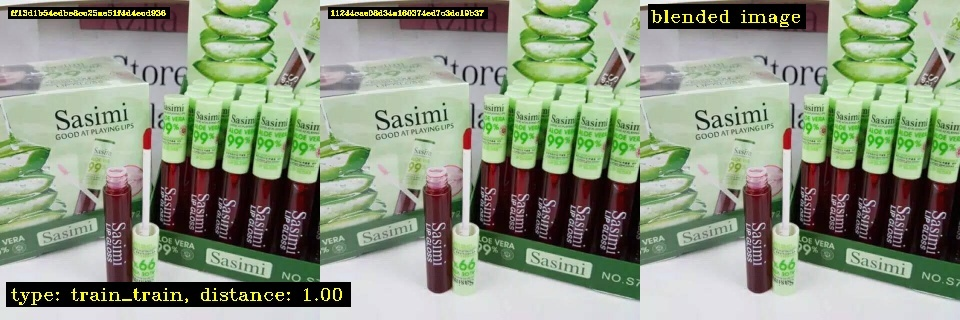
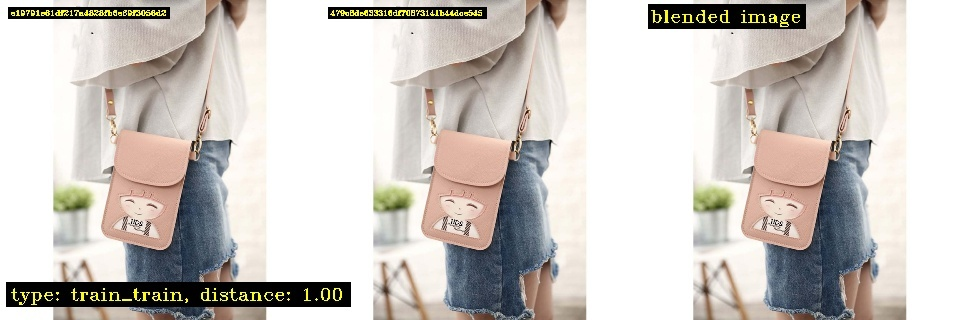
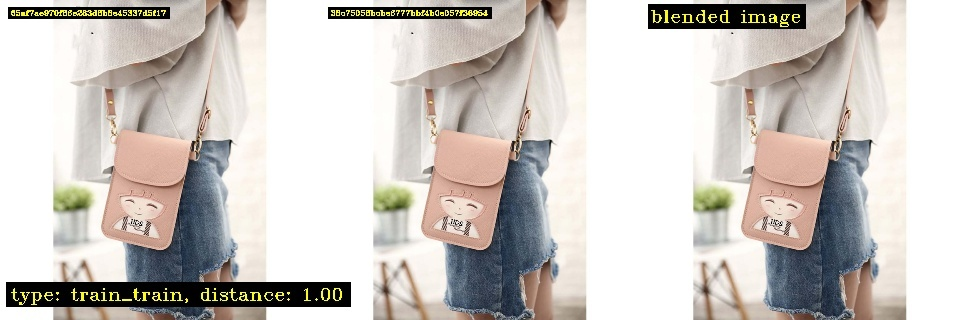
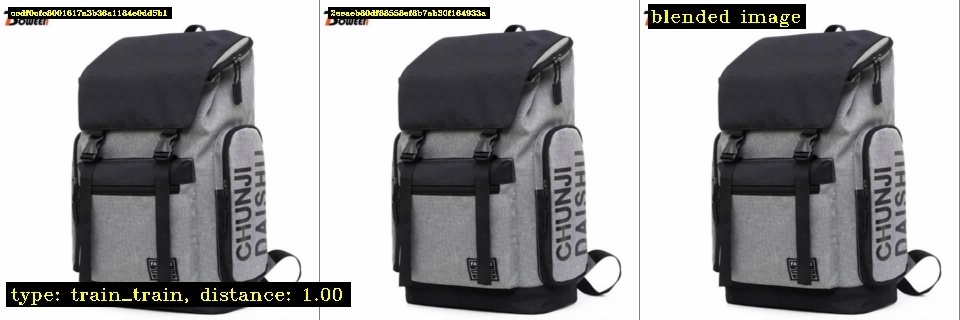

0

In [9]:
fd.vis.duplicates_gallery()

## Wrap Up
In this tutorial, we showed how you can run fastdup using pre-computed feature vectors. Running over pre-computed feature vectors significantly reduces run time compared to running over raw image files.

Next, feel free to check out other tutorials -

+ ⚡ [**Quickstart**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/quick-dataset-analysis.ipynb): Learn how to install fastdup, load a dataset and analyze it for potential issues such as duplicates/near-duplicates, broken images, outliers, dark/bright/blurry images, and view visually similar image clusters. If you're new, start here!
+ 🧹 [**Clean Image Folder**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/cleaning-image-dataset.ipynb): Learn how to analyze and clean a folder of images from potential issues and export a list of problematic files for further action. If you have an unorganized folder of images, this is a good place to start.
+ 🖼 [**Analyze Image Classification Dataset**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/analyzing-image-classification-dataset.ipynb): Learn how to load a labeled image classification dataset and analyze for potential issues. If you have labeled ImageNet-style folder structure, have a go!
+ 🎁 [**Analyze Object Detection Dataset**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/analyzing-object-detection-dataset.ipynb): Learn how to load bounding box annotations for object detection and analyze for potential issues. If you have a COCO-style labeled object detection dataset, give this example a try.


## VL Profiler - A faster and easier way to diagnose and visualize dataset issues

If you prefer a no-code platform to inspect and visualize your dataset, [**try our free cloud product VL Profiler**](https://app.visual-layer.com) - VL Profiler is our first no-code commercial product that lets you visualize and inspect your dataset in your browser. 

VL Profiler is free to get started. Upload up to 1,000,000 images for analysis at zero cost!

[Sign up](https://app.visual-layer.com) now.

[![image](https://raw.githubusercontent.com/visual-layer/fastdup/main/gallery/github_banner_profiler.gif)](https://app.visual-layer.com)

As usual, feedback is welcome! Questions? Drop by our [Slack channel](https://visualdatabase.slack.com/join/shared_invite/zt-19jaydbjn-lNDEDkgvSI1QwbTXSY6dlA#/shared-invite/email) or open an issue on [GitHub](https://github.com/visual-layer/fastdup/issues).

<center> 
    <a href="https://www.visual-layer.com" target="_blank" rel="noopener noreferrer">
    <picture>
    <source media="(prefers-color-scheme: dark)" srcset="https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo_dark_mode.png" width=200>
    <source media="(prefers-color-scheme: light)" srcset="https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo.png" width=200>
    <img alt="vl logo." src="https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo.png" width=200>
    </picture>
    </a><br>
    <a href="https://github.com/visual-layer/fastdup" target="_blank" style="text-decoration: none;"> GitHub </a> •
    <a href="https://visual-layer.slack.com/" target="_blank" style="text-decoration: none;"> Join Slack Community </a> •
    <a href="https://visual-layer.readme.io/discuss" target="_blank" style="text-decoration: none;"> Discussion Forum </a>
</center>

<center> 
    <a href="https://medium.com/visual-layer" target="_blank" style="text-decoration: none;"> Blog </a> •
    <a href="https://visual-layer.readme.io/" target="_blank" style="text-decoration: none;"> Documentation </a> •
    <a href="https://visual-layer.com/about" target="_blank" style="text-decoration: none;"> About Us </a> 
</center>

<center> 
    <a href="https://www.linkedin.com/company/visual-layer/" target="_blank" style="text-decoration: none;"> LinkedIn </a> •
    <a href="https://twitter.com/visual_layer" target="_blank" style="text-decoration: none;"> Twitter </a>
</center>